In [1]:
import math
import numpy as np
import cv2 as cv
import urllib.request
import IPython
import base64
import html

# Utility function to show an image
def show(*images, enlarge_small_images = True, max_per_row = -1, font_size = 0):
  if len(images) == 2 and type(images[1])==str:
      images = [(images[0], images[1])]

  def convert_for_display(img):
      if img.dtype!=np.uint8:
          a, b = img.min(), img.max()
          if a==b:
              offset, mult, d = 0, 0, 1
          elif a<0:
              offset, mult, d = 128, 127, max(abs(a), abs(b))
          else:
              offset, mult, d = 0, 255, b
          img = np.clip(offset + mult*(img.astype(float))/d, 0, 255).astype(np.uint8)
      return img

  def convert(imgOrTuple):
      try:
          img, title = imgOrTuple
          if type(title)!=str:
              img, title = imgOrTuple, ''
      except ValueError:
          img, title = imgOrTuple, ''        
      if type(img)==str:
          data = img
      else:
          img = convert_for_display(img)
          if enlarge_small_images:
              REF_SCALE = 100
              h, w = img.shape[:2]
              if h<REF_SCALE or w<REF_SCALE:
                  scale = max(1, min(REF_SCALE//h, REF_SCALE//w))
                  img = cv.resize(img,(w*3*scale,h*3*scale), interpolation=cv.INTER_NEAREST)
          data = 'data:Real/BMP;base64,' + base64.b64encode(cv.imencode('.BMP', img)[1]).decode('utf8')
      return data, title
    
  if max_per_row == -1:
      max_per_row = len(images)

  rows = [images[x:x+max_per_row] for x in range(0, len(images), max_per_row)]
  font = f"font-size: {font_size}px;" if font_size else ""

  html_content = ""
  for r in rows:
      l = [convert(t) for t in r]
      html_content += "".join(["<table><tr>"] 
              + [f"<td style='text-align:center;{font}'>{html.escape(t)}</td>" for _,t in l]    
              + ["</tr><tr>"] 
              + [f"<td style='text-align:center;'><img src='{d}'></td>" for d,_ in l]
              + ["</tr></table>"])
  IPython.display.display(IPython.display.HTML(html_content))

# Utility function to load an image from an URL
def load_from_url(url):
  resp = urllib.request.urlopen(url)
  image = np.asarray(bytearray(resp.read()), dtype=np.uint8)
  return cv.imdecode(image, cv.IMREAD_GRAYSCALE)

# Utility function to draw orientations over an image
def draw_orientations(fingerprint, orientations, strengths, mask, scale = 3, step = 8, border = 0):
    if strengths is None:
        strengths = np.ones_like(orientations)
    h, w = fingerprint.shape
    sf = cv.resize(fingerprint, (w*scale, h*scale), interpolation = cv.INTER_NEAREST)
    res = cv.cvtColor(sf, cv.COLOR_GRAY2BGR)
    d = (scale // 2) + 1
    sd = (step+1)//2
    c = np.round(np.cos(orientations) * strengths * d * sd).astype(int)
    s = np.round(-np.sin(orientations) * strengths * d * sd).astype(int) # minus for the direction of the y axis
    thickness = 1 + scale // 5
    for y in range(border, h-border, step):
        for x in range(border, w-border, step):
            if mask is None or mask[y, x] != 0:
                ox, oy = c[y, x], s[y, x]
                cv.line(res, (d+x*scale-ox,d+y*scale-oy), (d+x*scale+ox,d+y*scale+oy), (255,0,0), thickness, cv.LINE_AA)
    return res

# Utility function to draw a set of minutiae over an image
def draw_minutiae(fingerprint, minutiae, termination_color = (255,0,0), bifurcation_color = (0,0,255)):
    res = cv.cvtColor(fingerprint, cv.COLOR_GRAY2BGR)
    
    for x, y, t, *d in minutiae:
        color = termination_color if t else bifurcation_color
        if len(d)==0:
            cv.drawMarker(res, (x,y), color, cv.MARKER_CROSS, 8)
        else:
            d = d[0]
            ox = int(round(math.cos(d) * 7))
            oy = int(round(math.sin(d) * 7))
            cv.circle(res, (x,y), 3, color, 1, cv.LINE_AA)
            cv.line(res, (x,y), (x+ox,y-oy), color, 1, cv.LINE_AA)        
    return res

# Utility function to generate gabor filter kernels

_sigma_conv = (3.0/2.0)/((6*math.log(10))**0.5)
# sigma is adjusted according to the ridge period, so that the filter does not contain more than three effective peaks 
def _gabor_sigma(ridge_period):
    return _sigma_conv * ridge_period

def _gabor_size(ridge_period):
    p = int(round(ridge_period * 2 + 1))
    if p % 2 == 0:
        p += 1
    return (p, p)

def gabor_kernel(period, orientation):
    f = cv.getGaborKernel(_gabor_size(period), _gabor_sigma(period), np.pi/2 - orientation, period, gamma = 1, psi = 0)
    f /= f.sum()
    f -= f.mean()
    return f


# Utility functions for minutiae
def angle_abs_difference(a, b):
    return math.pi - abs(abs(a - b) - math.pi)

def angle_mean(a, b):
    return math.atan2((math.sin(a)+math.sin(b))/2, ((math.cos(a)+math.cos(b))/2))

# Utility functions for MCC
def draw_minutiae_and_cylinder(fingerprint, origin_cell_coords, minutiae, values, i, show_cylinder = True):

    def _compute_actual_cylinder_coordinates(x, y, t, d):
        c, s = math.cos(d), math.sin(d)
        rot = np.array([[c, s],[-s, c]])    
        return (rot@origin_cell_coords.T + np.array([x,y])[:,np.newaxis]).T
    
    res = draw_minutiae(fingerprint, minutiae)    
    if show_cylinder:
        for v, (cx, cy) in zip(values[i], _compute_actual_cylinder_coordinates(*minutiae[i])):
            cv.circle(res, (int(round(cx)), int(round(cy))), 3, (0,int(round(v*255)),0), 1, cv.LINE_AA)
    return res

def draw_match_pairs(f1, m1, v1, f2, m2, v2, cells_coords, pairs, i, show_cylinders = True):
    #nd = _current_parameters.ND
    h1, w1 = f1.shape
    h2, w2 = f2.shape
    p1, p2 = pairs
    res = np.full((max(h1,h2), w1+w2, 3), 255, np.uint8)
    res[:h1,:w1] = draw_minutiae_and_cylinder(f1, cells_coords, m1, v1, p1[i], show_cylinders)
    res[:h2,w1:w1+w2] = draw_minutiae_and_cylinder(f2, cells_coords, m2, v2, p2[i], show_cylinders)
    for k, (i1, i2) in enumerate(zip(p1, p2)):
        (x1, y1, *_), (x2, y2, *_) = m1[i1], m2[i2]
        cv.line(res, (int(x1), int(y1)), (w1+int(x2), int(y2)), (0,0,255) if k!=i else (0,255,255), 1, cv.LINE_AA)
    return res

In [2]:
import os

DATA_DIR = '/content/drive/MyDrive/Fingerprint Recognition'
print(os.listdir(DATA_DIR))

['SOCOFing.zip', 'SOCOFing', 'socofing']


In [3]:
import math
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from os import path
# !pip install python-utils

from ipywidgets import interact

In [4]:
!pip install utils
from utils import *

First we do fingerprint segmentation. The segmentation step is aimed at separating the fingerprint area (foreground) from the background.
The foreground is characterized by the presence of a striped and oriented pattern; background presents a uniform pattern.   
We will use a very simple technique based on the magnitude of the local gradient.


In [5]:
from PIL import Image

In [6]:
# img = np.array(Image.open('/content/drive/MyDrive/Fingerprint_Dataset1/Real/569__M_Left_ring_finger.BMP'))

In [7]:
fingerprint = cv.imread('/content/drive/MyDrive/Fingerprint_Dataset1/Real/600__M_Right_ring_finger.BMP', cv.IMREAD_GRAYSCALE)

In [8]:
show(fingerprint, f'Fingerprint with size (w,h): {fingerprint.shape[::-1]}')

"Fingerprint with size (w,h): (96, 103)"


In [9]:
# Calculate the local gradient (using Sobel filters)
gx, gy = cv.Sobel(fingerprint, cv.CV_32F, 1, 0), cv.Sobel(fingerprint, cv.CV_32F, 0, 1)
show((gx, 'Gx'), (gy, 'Gy'))

Gx,Gy


In [10]:
# Calculate the magnitude of the gradient for each pixel
gx2, gy2 = gx**2, gy**2
gm = np.sqrt(gx2 + gy2)
show((gx2, 'Gx**2'), (gy2, 'Gy**2'), (gm, 'Gradient magnitude'))

Gx**2,Gy**2,Gradient magnitude


In [11]:
# Integral over a square window
sum_gm = cv.boxFilter(gm, -1, (25, 25), normalize = False)
show(sum_gm, 'Integral of the gradient magnitude')

Integral of the gradient magnitude


In [12]:
# Use a simple threshold for segmenting the fingerprint pattern
thr = sum_gm.max() * 0.2
mask = cv.threshold(sum_gm, thr, 255, cv.THRESH_BINARY)[1].astype(np.uint8)
show(fingerprint, mask, cv.merge((mask, fingerprint, fingerprint)))

,,


##Estimating local ridge orientation

The ridge orientation is estimated as ortoghonal to the gradient orientation, averaged over a window $W$.  

$G_{xx}=\sum_W{G_x^2}$, $G_{yy}=\sum_W{G_y^2}$, $G_{xy}=\sum_W{G_xG_y}$

$\theta=\frac{\pi}{2} + \frac{phase(G_{xx}-G_{yy}, 2G_{xy})}{2}$

For each orientation, we will also calculate a confidence value (strength), which measures how much all gradients in $W$ share the same orientation.  

$strength = \frac{\sqrt{(G_{xx}-G_{yy})^2+(2G_{xy})^2}}{G_{xx}+G_{yy}}$

In [13]:
W = (23, 23)
gxx = cv.boxFilter(gx2, -1, W, normalize = False)
gyy = cv.boxFilter(gy2, -1, W, normalize = False)
gxy = cv.boxFilter(gx * gy, -1, W, normalize = False)
gxx_gyy = gxx - gyy
gxy2 = 2 * gxy

orientations = (cv.phase(gxx_gyy, -gxy2) + np.pi) / 2 # '-' to adjust for y axis direction
sum_gxx_gyy = gxx + gyy
strengths = np.divide(cv.sqrt((gxx_gyy**2 + gxy2**2)), sum_gxx_gyy, out=np.zeros_like(gxx), where=sum_gxx_gyy!=0)
show(draw_orientations(fingerprint, orientations, strengths, mask, 1, 16), 'Orientation image')

Orientation image


Here we can see that due to the smaller pixel values the local ridge orientation could not be applied to the proper scale. Therefore, I'm going to use a dataset that has sample images with higher pixel values so that local ridge orientation can be applied to scale

In [ ]:
# Utility function to show an image
def show_png(*images, enlarge_small_images = True, max_per_row = -1, font_size = 0):
  if len(images) == 2 and type(images[1])==str:
      images = [(images[0], images[1])]

  def convert_for_display(img):
      if img.dtype!=np.uint8:
          a, b = img.min(), img.max()
          if a==b:
              offset, mult, d = 0, 0, 1
          elif a<0:
              offset, mult, d = 128, 127, max(abs(a), abs(b))
          else:
              offset, mult, d = 0, 255, b
          img = np.clip(offset + mult*(img.astype(float))/d, 0, 255).astype(np.uint8)
      return img

  def convert(imgOrTuple):
      try:
          img, title = imgOrTuple
          if type(title)!=str:
              img, title = imgOrTuple, ''
      except ValueError:
          img, title = imgOrTuple, ''        
      if type(img)==str:
          data = img
      else:
          img = convert_for_display(img)
          if enlarge_small_images:
              REF_SCALE = 100
              h, w = img.shape[:2]
              if h<REF_SCALE or w<REF_SCALE:
                  scale = max(1, min(REF_SCALE//h, REF_SCALE//w))
                  img = cv.resize(img,(w*scale,h*scale), interpolation=cv.INTER_NEAREST)
          data = 'data:samples/png;base64,' + base64.b64encode(cv.imencode('.png', img)[1]).decode('utf8')
      return data, title
    
  if max_per_row == -1:
      max_per_row = len(images)

  rows = [images[x:x+max_per_row] for x in range(0, len(images), max_per_row)]
  font = f"font-size: {font_size}px;" if font_size else ""

  html_content = ""
  for r in rows:
      l = [convert(t) for t in r]
      html_content += "".join(["<table><tr>"] 
              + [f"<td style='text-align:center;{font}'>{html.escape(t)}</td>" for _,t in l]    
              + ["</tr><tr>"] 
              + [f"<td style='text-align:center;'><img src='{d}'></td>" for d,_ in l]
              + ["</tr></table>"])
  IPython.display.display(IPython.display.HTML(html_content))

In [ ]:
fingerprint1 = cv.imread('/content/drive/MyDrive/Fingerprint_Dataset/samples/sample_1_1.png', cv.IMREAD_GRAYSCALE)
show_png(fingerprint1, f'Fingerprint with size (w,h): {fingerprint1.shape[::-1]}')
print(fingerprint1)

"Fingerprint with size (w,h): (256, 364)"


[[242 253 253 ... 253 253 253]
 [253 253 253 ... 253 253 253]
 [253 253 253 ... 253 253 253]
 ...
 [253 253 253 ... 253 253 253]
 [253 253 253 ... 253 253 253]
 [253 253 253 ... 253 253 253]]


In [ ]:
# Calculate the local gradient (using Sobel filters)
gx, gy = cv.Sobel(fingerprint1, cv.CV_32F, 1, 0), cv.Sobel(fingerprint1, cv.CV_32F, 0, 1)
show((gx, 'Gx'), (gy, 'Gy'))

Gx,Gy


In [ ]:
# Calculate the magnitude of the gradient for each pixel
gx2, gy2 = gx**2, gy**2
gm = np.sqrt(gx2 + gy2)
show((gx2, 'Gx**2'), (gy2, 'Gy**2'), (gm, 'Gradient magnitude'))

Gx**2,Gy**2,Gradient magnitude


In [ ]:
# Integral over a square window
sum_gm = cv.boxFilter(gm, -1, (25, 25), normalize = False)
show(sum_gm, 'Integral of the gradient magnitude')

Integral of the gradient magnitude


In [ ]:
# Use a simple threshold for segmenting the fingerprint pattern
thr = sum_gm.max() * 0.2
mask = cv.threshold(sum_gm, thr, 255, cv.THRESH_BINARY)[1].astype(np.uint8)
show(fingerprint1, mask, cv.merge((mask, fingerprint1, fingerprint1)))

,,


##Estimating local ridge orientation

The ridge orientation is estimated as ortoghonal to the gradient orientation, averaged over a window $W$.  

$G_{xx}=\sum_W{G_x^2}$, $G_{yy}=\sum_W{G_y^2}$, $G_{xy}=\sum_W{G_xG_y}$

$\theta=\frac{\pi}{2} + \frac{phase(G_{xx}-G_{yy}, 2G_{xy})}{2}$

For each orientation, we will also calculate a confidence value (strength), which measures how much all gradients in $W$ share the same orientation.  

$strength = \frac{\sqrt{(G_{xx}-G_{yy})^2+(2G_{xy})^2}}{G_{xx}+G_{yy}}$

In [ ]:
W = (23, 23)
gxx = cv.boxFilter(gx2, -1, W, normalize = False)
gyy = cv.boxFilter(gy2, -1, W, normalize = False)
gxy = cv.boxFilter(gx * gy, -1, W, normalize = False)
gxx_gyy = gxx - gyy
gxy2 = 2 * gxy

orientations = (cv.phase(gxx_gyy, -gxy2) + np.pi) / 2 # '-' to adjust for y axis direction
sum_gxx_gyy = gxx + gyy
strengths = np.divide(cv.sqrt((gxx_gyy**2 + gxy2**2)), sum_gxx_gyy, out=np.zeros_like(gxx), where=sum_gxx_gyy!=0)
show(draw_orientations(fingerprint1, orientations, strengths, mask, 1, 16), 'Orientation image')

Orientation image


##Estimating local ridge frequency

The local ridge frequency $f_{j,i}$ at $(j,i)$ is the number of ridges per unit length along a hypothetical segment centered in $(j,i)$ and orthogonal to the local ridge orientation $\theta_{j,i}$.

For simplicity, we will assume a constant frequency over all the fingerprint and estimate its reciprocal (the ridge-line period) from a small region of the image.

In [ ]:
region = fingerprint1[10:90,80:130]
show(region)

""


In [ ]:
# before computing the x-signature, the region is smoothed to reduce noise
smoothed = cv.blur(region, (5,5), -1)
xs = np.sum(smoothed, 1) # the x-signature of the region
print(xs)

[10697 10796 11245 11970 12058 11508 10815 10064  9314  9125  9707 10389
 10912 11370 11564 11116 10419  9916  9532  9250  9370  9833 10348 10899
 11430 11429 11180 10773 10152  9409  9243  9351  9847 10620 11430 11482
 11147 10536  9791  9010  8966  9337  9845 10431 10986 11071 10877 10416
  9732  9264  9514  9946 10642 11353 11533 11050 10398  9649  9345  9636
 10183 10614 10849 10646 10197  9827  9762  9908 10237 10529 10628 10437
 10203 10011 10108 10364 10658 10828 10986 11106]


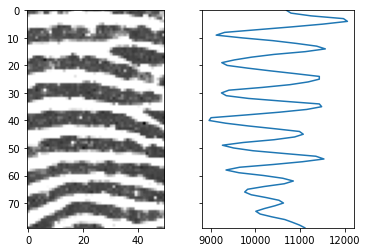

In [ ]:
x = np.arange(region.shape[0])
f, axarr = plt.subplots(1,2, sharey = True)
axarr[0].imshow(region,cmap='gray')
axarr[1].plot(xs, x)
axarr[1].set_ylim(region.shape[0]-1,0)
plt.show()

In [ ]:
# Find the indices of the x-signature local maxima
local_maxima = np.nonzero(np.r_[False, xs[1:] > xs[:-1]] & np.r_[xs[:-1] >= xs[1:], False])[0]

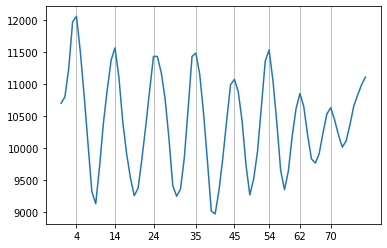

In [ ]:
x = np.arange(region.shape[0])
plt.plot(x, xs)
plt.xticks(local_maxima)
plt.grid(True, axis='x')
plt.show()

In [ ]:
# Calculate all the distances between consecutive peaks
distances = local_maxima[1:] - local_maxima[:-1]
print(distances)

[10 10 11 10  9  8  8]


In [ ]:
# Estimate the ridge line period as the average of the above distances
ridge_period = np.average(distances)
print(ridge_period)

9.428571428571429


##Fingerprint Enhancement

In order to enhance the fingerprint pattern, we will perform a *contextual convolution* with a bank of Gabor filters.  
In this simple example we are using a constant ridge-line frequency, hence all the filters will have the same period and the only parameter will be the number of orientations (or_count).  
As it is a contextual convolution, a different filter should be applied to each pixel, according to the corresponding ridge-line orientation. Unfortunately this kind of operation is not available in OpenCV and implementing it in Python would be very inefficient; hence, we will apply all the filters to the whole image (that is, producing a filtered image for each filter) and then we will assemble the enhanced image taking the right pixel from each filtered image, using the discretized orientation indices as a lookup table.

In [ ]:
# Create the filter bank
or_count = 5
gabor_bank = [gabor_kernel(ridge_period, o) for o in np.arange(0, np.pi, np.pi/or_count)]

In [ ]:
# Filter the whole image with each filter
# Note that the negative image is actually used, to have white ridges on a black background as a result
nf = 255-fingerprint1
all_filtered = np.array([cv.filter2D(nf, cv.CV_32F, f) for f in gabor_bank])
show(nf, *all_filtered)

,,,,,


In [ ]:
y_coords, x_coords = np.indices(fingerprint1.shape)
# For each pixel, find the index of the closest orientation in the gabor bank
orientation_idx = np.round(((orientations % np.pi) / np.pi) * or_count).astype(np.int32) % or_count
# Take the corresponding convolution result for each pixel, to assemble the final result
filtered = all_filtered[orientation_idx, y_coords, x_coords]
# Convert to gray scale and apply the mask
enhanced = mask & np.clip(filtered, 0, 255).astype(np.uint8)
show(fingerprint1, enhanced)

,


##Detecting minutiae positions

In this simple example, minutiae will be detected from the *ridge line skeleton*, obtained by binarizing and thinning the enhanced ridge lines.

In [ ]:
# Binarization
_, ridge_lines = cv.threshold(enhanced, 32, 255, cv.THRESH_BINARY)
show_png(fingerprint1, ridge_lines, cv.merge((ridge_lines, fingerprint1, fingerprint1)))

,,


In [ ]:
# Thinning
skeleton = cv.ximgproc.thinning(ridge_lines, thinningType = cv.ximgproc.THINNING_GUOHALL)
show_png(skeleton, cv.merge((fingerprint1, fingerprint1, skeleton)))

,


Then, for each pixel $p$ of the skeleton, the *crossing number* $cn(p)$ is computed as the number of transitions from black to white pixels in its 8-neighborhood

```
   v[0] v[1] v[2]
   v[7]   p  v[3]
   v[6] v[5] v[4]
```
$cn(v)=\sum_{i=0}^7\begin{cases} 1 & \mbox{if } v[i]<v[(i+1) \mod 8] \\ 0 & \mbox{otherwise} \end{cases}$

To efficiently compute all the crossing numbers, a 3x3 filter is used to convert each possible 8-neighborhood into a byte value (by considering each pixel as a bit).  
Then a lookup table maps each byte value [0,255] into the corresponding crossing number.

In [ ]:
def compute_crossing_number(values):
    return np.count_nonzero(values < np.roll(values, -1))

In [ ]:
# Create a filter that converts any 8-neighborhood into the corresponding byte value [0,255]
cn_filter = np.array([[  1,  2,  4],
                      [128,  0,  8],
                      [ 64, 32, 16]
                     ])

In [ ]:
# Create a lookup table that maps each byte value to the corresponding crossing number
all_8_neighborhoods = [np.array([int(d) for d in f'{x:08b}'])[::-1] for x in range(256)]
cn_lut = np.array([compute_crossing_number(x) for x in all_8_neighborhoods]).astype(np.uint8)

In [ ]:
# Skeleton: from 0/255 to 0/1 values
skeleton01 = np.where(skeleton!=0, 1, 0).astype(np.uint8)
# Apply the filter to encode the 8-neighborhood of each pixel into a byte [0,255]
cn_values = cv.filter2D(skeleton01, -1, cn_filter, borderType = cv.BORDER_CONSTANT)
# Apply the lookup table to obtain the crossing number of each pixel
cn = cv.LUT(cn_values, cn_lut)
# Keep only crossing numbers on the skeleton
cn[skeleton==0] = 0

The list of minutiae is finally obtained from the coordinates of pixels with crossing number 1 (terminations) or 3 (bifurcations).  
Each minutia is stored as a tuple $(x, y, t)$ where $t$ is $true$ for terminations.  
Note that, for now, we are not computing the minutiae *direction*, but only their location and type.

In [ ]:
# crossing number == 1 --> Termination, crossing number == 3 --> Bifurcation
minutiae = [(x,y,cn[y,x]==1) for y, x in zip(*np.where(np.isin(cn, [1,3])))]

In [ ]:
show(draw_minutiae(fingerprint1, minutiae), skeleton, draw_minutiae(skeleton, minutiae))

,,


From the above image we can note that near the borders of the pattern many false minutiae are detected: we can remove them by computing the *distance transform* of the segmentation mask and choosing a threshold so that minutiae too close to the mask border are excluded.


In [ ]:
# A 1-pixel background border is added to the mask before computing the distance transform
mask_distance = cv.distanceTransform(cv.copyMakeBorder(mask, 1, 1, 1, 1, cv.BORDER_CONSTANT), cv.DIST_C, 3)[1:-1,1:-1]
show(mask, mask_distance)

,


In [ ]:
filtered_minutiae = list(filter(lambda m: mask_distance[m[1], m[0]]>10, minutiae))

In [ ]:
show_png(draw_minutiae(fingerprint1, filtered_minutiae), skeleton, draw_minutiae(skeleton, filtered_minutiae))

,,


##Estiamting minutiae directions

The direction of a termination will be computed by following the ridge-line until another minutia is found or a distance of 20 pixels has been traveled.  
The direction of a bifurcation will be computed by considering the directions ($\theta_1$, $\theta_2$, $\theta_3$) of its three branches and calculating the mean of the two closest ones ($\theta_1$ and $\theta_2$ in the example below).  
Note that this is a simplified definition of minutiae direction, not completely consistent to the ISO standard minutiae-based template format, which is based on ridge and valley skeletons (see *ISO/IEC 19794-2, 2005*).

<img src="https://biolab.csr.unibo.it/samples/fr/images/min_directions.png">

In order to follow the ridge-line, for each position on the skeleton, the position of the next pixel to be visited must be determined. In the following, the eight possible direction of movement will be encoded as integer numbers in [0,7], following the same ordering previously used for the 8-neighborhood of a pixel $p$:

```
   0  1  2
   7  p  3
   6  5  4
```

The following function, given the previous direction of movement and the values of the 8 neighboring pixels, returns the  directions towards neighboring skeleton pixels, excluding the previously-visited one. A special value (8) indicates that there is no previous direction: it will be used at the first step.

In [ ]:
def compute_next_ridge_following_directions(previous_direction, values):    
    next_positions = np.argwhere(values!=0).ravel().tolist()
    if len(next_positions) > 0 and previous_direction != 8:
        # There is a previous direction: return all the next directions, sorted according to the distance from it,
        #                                except the direction, if any, that corresponds to the previous position
        next_positions.sort(key = lambda d: 4 - abs(abs(d - previous_direction) - 4))
        if next_positions[-1] == (previous_direction + 4) % 8: # the direction of the previous position is the opposite one
            next_positions = next_positions[:-1] # removes it
    return next_positions

In [ ]:
#The next cell prepares two look-up tables.

r2 = 2**0.5 # sqrt(2)

# The eight possible (x, y) offsets with each corresponding Euclidean distance
xy_steps = [(-1,-1,r2),( 0,-1,1),( 1,-1,r2),( 1, 0,1),( 1, 1,r2),( 0, 1,1),(-1, 1,r2),(-1, 0,1)]

# LUT: for each 8-neighborhood and each previous direction [0,8], 
#      where 8 means "none", provides the list of possible directions
nd_lut = [[compute_next_ridge_following_directions(pd, x) for pd in range(9)] for x in all_8_neighborhoods]

The next function follows the skeleton until another minutia is found or a distance of 20 pixels has been traveled. If a minimum length of 10 pixels has been reached, it returns the corresponding angle, otherwise it returns None.

In [ ]:
def follow_ridge_and_compute_angle(x, y, d = 8):
    px, py = x, y
    length = 0.0
    while length < 20: # max length followed
        next_directions = nd_lut[cn_values[py,px]][d]
        if len(next_directions) == 0:
            break
        # Need to check ALL possible next directions
        if (any(cn[py + xy_steps[nd][1], px + xy_steps[nd][0]] != 2 for nd in next_directions)):
            break # another minutia found: we stop here
        # Only the first direction has to be followed
        d = next_directions[0]
        ox, oy, l = xy_steps[d]
        px += ox ; py += oy ; length += l
    # check if the minimum length for a valid direction has been reached
    return math.atan2(-py+y, px-x) if length >= 10 else None

The cell below estimates all minutiae directions:
- in case of a termination, it simply calls the previous function,
- in case of a bifurcation, it follows the three branches and if all the three angles are valid, it computes the mean of the two closest ones.

The list of minutiae is finally obtained, with each minutia stored as a tuple $(x, y, t, d)$ where $t$ is $true$ for terminations and $d$ is the minutia direction in radians.

In [ ]:
valid_minutiae = []
for x, y, term in filtered_minutiae:
    d = None
    if term: # termination: simply follow and compute the direction        
        d = follow_ridge_and_compute_angle(x, y)
    else: # bifurcation: follow each of the three branches
        dirs = nd_lut[cn_values[y,x]][8] # 8 means: no previous direction
        if len(dirs)==3: # only if there are exactly three branches
            angles = [follow_ridge_and_compute_angle(x+xy_steps[d][0], y+xy_steps[d][1], d) for d in dirs]
            if all(a is not None for a in angles):
                a1, a2 = min(((angles[i], angles[(i+1)%3]) for i in range(3)), key=lambda t: angle_abs_difference(t[0], t[1]))
                d = angle_mean(a1, a2)                
    if d is not None:
        valid_minutiae.append( (x, y, term, d) )

In [ ]:
show(draw_minutiae(fingerprint1, valid_minutiae))

""


##Creating local structures

In this section, starting from minutiae positions and directions, we will create local structures invariant for translation and rotation, which can be used for comparing fingerprints without a pre-alignment step.  
We will use a simplified version of Minutia Cylinder-Code (MCC, see *Minutia Cylinder-Code: a new representation and matching technique for fingerprint recognition", IEEE tPAMI 2010*): while MCC local structures can be represented as 3D structures (cylinders), where the base encodes spatial relationships between minutiae and the height directional relationships, here we will consider only the base of the cylinders, which is rotated according to the minutia direction and discretized into a fixed number of cells.

<img src="https://biolab.csr.unibo.it/samples/fr/images/simple_mcc.png">


In [ ]:
# Compute the cell coordinates of a generic local structure
mcc_radius = 70
mcc_size = 16

g = 2 * mcc_radius / mcc_size
x = np.arange(mcc_size)*g - (mcc_size/2)*g + g/2
y = x[..., np.newaxis]
iy, ix = np.nonzero(x**2 + y**2 <= mcc_radius**2)
ref_cell_coords = np.column_stack((x[ix], x[iy]))

In [ ]:
mcc_sigma_s = 7.0
mcc_tau_psi = 400.0
mcc_mu_psi = 1e-2

def Gs(t_sqr):
    """Gaussian function with zero mean and mcc_sigma_s standard deviation, see eq. (7) in MCC paper"""
    return np.exp(-0.5 * t_sqr / (mcc_sigma_s**2)) / (math.tau**0.5 * mcc_sigma_s)

def Psi(v):
    """Sigmoid function that limits the contribution of dense minutiae clusters, see eq. (4)-(5) in MCC paper"""
    return 1. / (1. + np.exp(-mcc_tau_psi * (v - mcc_mu_psi)))

In [ ]:
# n: number of minutiae
# c: number of cells in a local structure

xyd = np.array([(x,y,d) for x,y,_,d in valid_minutiae]) # matrix with all minutiae coordinates and directions (n x 3)

# rot: n x 2 x 2 (rotation matrix for each minutia)
d_cos, d_sin = np.cos(xyd[:,2]).reshape((-1,1,1)), np.sin(xyd[:,2]).reshape((-1,1,1))
rot = np.block([[d_cos, d_sin], [-d_sin, d_cos]])

# rot@ref_cell_coords.T : n x 2 x c
# xy : n x 2
xy = xyd[:,:2]
# cell_coords: n x c x 2 (cell coordinates for each local structure)
cell_coords = np.transpose(rot@ref_cell_coords.T + xy[:,:,np.newaxis],[0,2,1])

# cell_coords[:,:,np.newaxis,:]      :  n x c  x 1 x 2
# xy                                 : (1 x 1) x n x 2
# cell_coords[:,:,np.newaxis,:] - xy :  n x c  x n x 2
# dists: n x c x n (for each cell of each local structure, the distance from all minutiae)
dists = np.sum((cell_coords[:,:,np.newaxis,:] - xy)**2, -1)

# cs : n x c x n (the spatial contribution of each minutia to each cell of each local structure)
cs = Gs(dists)
diag_indices = np.arange(cs.shape[0])
cs[diag_indices,:,diag_indices] = 0 # remove the contribution of each minutia to its own cells

# local_structures : n x c (cell values for each local structure)
local_structures = Psi(np.sum(cs, -1))

In [ ]:
@interact(i=(0,len(valid_minutiae)-1))
def test(i=2):
    show(draw_minutiae_and_cylinder(fingerprint1, ref_cell_coords, valid_minutiae, local_structures, i))

interactive(children=(IntSlider(value=2, description='i', max=52), Output()), _dom_classes=('widget-interact',…

##Fingerprint Comparison

We started from an image (*fingerprint1*), obtained a list of minutiae (*valid_minutiae*) and their corresponding local structures (matrix *local_structures* with a row for each minutia):

In [ ]:
print(f"""Fingerprint image: {fingerprint1.shape[1]}x{fingerprint1.shape[0]} pixels
Minutiae: {len(valid_minutiae)}
Local structures: {local_structures.shape}""")

Fingerprint image: 256x364 pixels
Minutiae: 53
Local structures: (53, 208)


In [ ]:
f1, m1, ls1 = fingerprint1, valid_minutiae, local_structures

In [ ]:
#Then we will load analogous data of another fingerprint: f2, m2, ls2

ofn = '/content/drive/MyDrive/Fingerprint_Dataset/samples/sample_1_2' # Fingerprint of the same finger
f2, (m2, ls2) = cv.imread(f'{ofn}.png', cv.IMREAD_GRAYSCALE), np.load(f'{ofn}.npz', allow_pickle=True).values()

The similarity between two local structures $r_1$ and $r_2$ can be simply computed as one minus their normalized Euclidean distance:

$similarity(r_1, r_2) = 1 - \frac {\| r_1 - r_2 \|}{\|r_1\| + \|r_2\|}$

The following cell computes the matrix of all normalized Euclidean distances between local structures in ls1 and ls2.

In [ ]:
# Compute all pairwise normalized Euclidean distances between local structures in v1 and v2
# ls1                       : n1 x  c
# ls1[:,np.newaxis,:]       : n1 x  1 x c
# ls2                       : (1 x) n2 x c
# ls1[:,np.newaxis,:] - ls2 : n1 x  n2 x c 
# dists                     : n1 x  n2
dists = np.sqrt(np.sum((ls1[:,np.newaxis,:] - ls2)**2, -1))
dists /= (np.sqrt(np.sum(ls1**2, 1))[:,np.newaxis] + np.sqrt(np.sum(ls2**2, 1))) # Normalize as in eq. (17) of MCC paper

In the next cell, we finally compare the two fingerprints by using the Local Similarity Sort (LSS) technique (see eq. 23 in the MCC paper), which simply selects the num_p highest similarities (i.e. the smallest distances) and compute the comparison *score* as their average. The indices of the corresponding minutia pairs are stored in *pairs*, and used in the last cell to show the result.

In [ ]:
# Select the num_p pairs with the smallest distances (LSS technique)
num_p = 5 # For simplicity: a fixed number of pairs
pairs = np.unravel_index(np.argpartition(dists, num_p, None)[:num_p], dists.shape)
score = 1 - np.mean(dists[pairs[0], pairs[1]]) # See eq. (23) in MCC paper
print(f'Comparison score: {score:.2f}')

Comparison score: 0.75


In [ ]:
@interact(i = (0,len(pairs[0])-1), show_local_structures = True)
def show_pairs(i=2, show_local_structures = False):
    show(draw_match_pairs(f1, m1, ls1, f2, m2, ls2, ref_cell_coords, pairs, i, show_local_structures))

interactive(children=(IntSlider(value=2, description='i', max=4), Checkbox(value=True, description='show_local…

##Training GANs to generate full fingerprints

In [ ]:
import os

DATA_DIR = '/content/drive/MyDrive/Fingerprint_Dataset1'
print(os.listdir(DATA_DIR))

['Real']


In [ ]:
print(os.listdir(DATA_DIR+'/Real')[:10])

['526__F_Right_ring_finger.BMP', '577__M_Right_little_finger.BMP', '569__M_Left_ring_finger.BMP', '561__M_Left_middle_finger.BMP', '569__M_Left_middle_finger.BMP', '535__M_Right_index_finger.BMP', '565__M_Left_ring_finger.BMP', '562__F_Right_index_finger.BMP', '551__F_Right_little_finger.BMP', '539__F_Left_middle_finger.BMP']


In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 25
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, 
                      batch_size, 
                      shuffle=True, 
                      # num_workers=2, 
                      pin_memory=True)

In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(9,9))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]),nrow=5,ncol=1).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

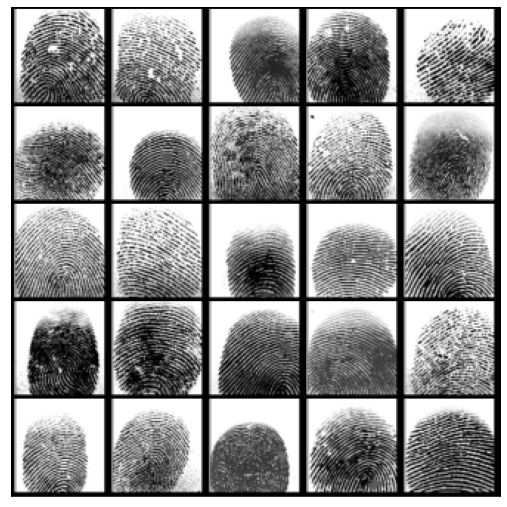

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([25, 3, 64, 64])


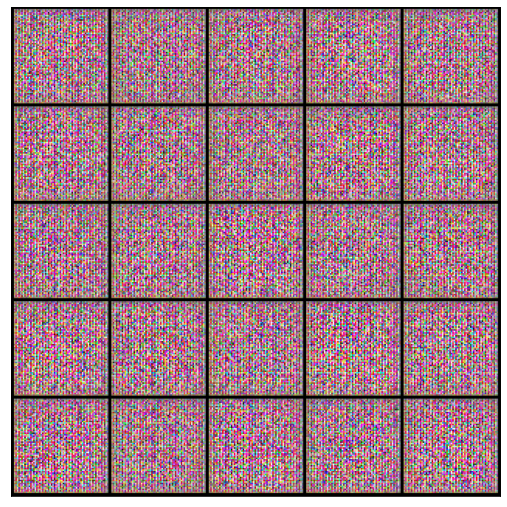

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = '/content/drive/MyDrive/Fingerprint_Dataset1/generated_fingerprint'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=5)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(9,9))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=5).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(5, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


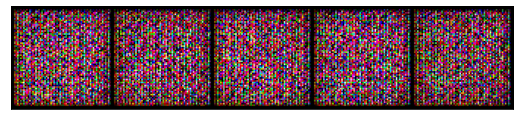

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 15

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [1/15], loss_g: 5.1327, loss_d: 1.5328, real_score: 0.8961, fake_score: 0.7327
Saving generated-images-0001.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [2/15], loss_g: 8.0922, loss_d: 0.9958, real_score: 0.9750, fake_score: 0.5970
Saving generated-images-0002.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [3/15], loss_g: 7.1529, loss_d: 0.2751, real_score: 0.9097, fake_score: 0.1463
Saving generated-images-0003.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [4/15], loss_g: 4.7396, loss_d: 0.1907, real_score: 0.8455, fake_score: 0.0112
Saving generated-images-0004.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [5/15], loss_g: 3.6380, loss_d: 1.6247, real_score: 0.2596, fake_score: 0.0012
Saving generated-images-0005.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [6/15], loss_g: 4.4827, loss_d: 0.2065, real_score: 0.9031, fake_score: 0.0907
Saving generated-images-0006.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [7/15], loss_g: 3.8921, loss_d: 0.0807, real_score: 0.9502, fake_score: 0.0252
Saving generated-images-0007.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [8/15], loss_g: 6.2880, loss_d: 0.1865, real_score: 0.9722, fake_score: 0.1406
Saving generated-images-0008.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [9/15], loss_g: 1.6374, loss_d: 0.4168, real_score: 0.7548, fake_score: 0.0611
Saving generated-images-0009.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [10/15], loss_g: 5.0829, loss_d: 0.1242, real_score: 0.9839, fake_score: 0.0962
Saving generated-images-0010.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [11/15], loss_g: 7.2382, loss_d: 0.0393, real_score: 0.9768, fake_score: 0.0150
Saving generated-images-0011.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [12/15], loss_g: 6.6051, loss_d: 0.2524, real_score: 0.9609, fake_score: 0.1689
Saving generated-images-0012.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [13/15], loss_g: 8.1366, loss_d: 2.4988, real_score: 0.1516, fake_score: 0.0000
Saving generated-images-0013.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [14/15], loss_g: 4.6182, loss_d: 0.1360, real_score: 0.9314, fake_score: 0.0551
Saving generated-images-0014.png


  0%|          | 0/240 [00:00<?, ?it/s]

Epoch [15/15], loss_g: 3.4564, loss_d: 0.1767, real_score: 0.9219, fake_score: 0.0822
Saving generated-images-0015.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

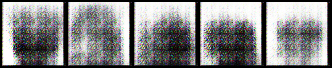

In [ ]:
#This is the output after just 1 epoch of training.
#We can see that some visible prints have been generated as though not very clear
from IPython.display import Image
Image('/content/drive/MyDrive/Fingerprint_Dataset1/generated_fingerprint/generated-images-0001.png')

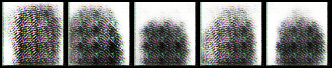

In [ ]:
#The output after 2nd epoch of training also seems to be very similar to that of
#1st epoch but the grain marks seem to be gone
from IPython.display import Image
Image('/content/drive/MyDrive/Fingerprint_Dataset1/generated_fingerprint/generated-images-0002.png')

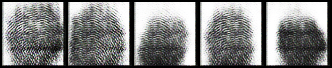

In [ ]:
from IPython.display import Image
Image('/content/drive/MyDrive/Fingerprint_Dataset1/generated_fingerprint/generated-images-0005.png')

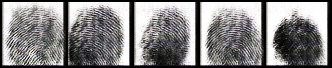

In [ ]:
from IPython.display import Image
Image('/content/drive/MyDrive/Fingerprint_Dataset1/generated_fingerprint/generated-images-0009.png')

The 9th epoch generated complete prints much better than the 1st and 2nd epochs.
As we train for more epochs the model gets better at generating the prints.
Due to data and gpu limitations this is the best result I could achieve with generating the fingerprints with this particular dataset.

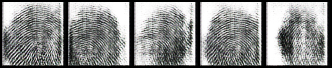

In [ ]:
from IPython.display import Image
Image('/content/drive/MyDrive/Fingerprint_Dataset1/generated_fingerprint/generated-images-0012.png')

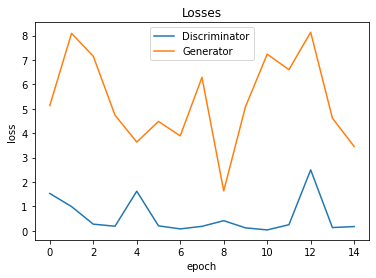

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

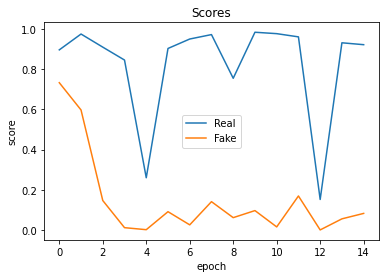

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');